### Task 3: Implementation and Visualisation of R2UNet

In [2]:
# Imports

import os
import imageio
import numpy as np
import random
from tqdm import tqdm
import matplotlib.pyplot as plt

import torch
from torch.utils import data
from torchvision import transforms
import torch.nn as nn
import torchvision

from metrics import eval_metrics
from utils import save_checkpoint, load_checkpoint, weight_decay, visualize_data 
from model import R2UNet
from loader import cityscapesLoader
from train import train
from augmentations import Compose, RandomHorizontallyFlip, RandomRotate, RandomVerticallyFlip, RandomTranslate
from evaluate import evaluation, CE_loss
from result_visualization import result_vis

Get necessary data files. Only run this code once.

In [4]:
#!wget --keep-session-cookies --save-cookies=cookies.txt --post-data 'username=username&password=password&submit=Login' https://www.cityscapes-dataset.com/login/

# !wget --load-cookies cookies.txt --content-disposition https://www.cityscapes-dataset.com/file-handling/?packageID=3 # => leftImg8bit
# !wget --load-cookies cookies.txt --content-disposition https://www.cityscapes-dataset.com/file-handling/?packageID=1 #=> gtFine

# !unzip gtFine_trainvaltest.zip
# !unzip leftImg8bit_trainvaltest.zip

In [3]:
import os
os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"] = "2"
torch.backends.cudnn.benchmark = False

torch.cuda.empty_cache()

import warnings
warnings.filterwarnings('ignore')

### 2.1 Define model architecture

In [9]:
model = R2UNet()
init_weights(model, init_type='kaiming', gain=0.02)

model initialization with kaiming


### 2.2 Hyperparameters

In [ ]:
bs = 6
epochs = 20
lr = 0.0001

### 2.3 Dataset and Dataloader

In [8]:
# Insert your own data path
local_path = "/arja_raid/datasets/Cityscapes"
augs = Compose([RandomRotate(10),RandomHorizontallyFlip(0.5),RandomVerticallyFlip(0.5)])

traindataset = cityscapesLoader(root=local_path, is_transform=True, split='train', augmentations = augs)
validdataset = cityscapesLoader(root=local_path, is_transform=True, split='val')

# dataloader variable
trainloader = data.DataLoader(traindataset, batch_size=bs, shuffle=True)
validloader = data.DataLoader(validdataset, batch_size=bs, shuffle=False)

Found 2975 train images
Found 500 val images


**Visualizing the Images and Ground Truths**

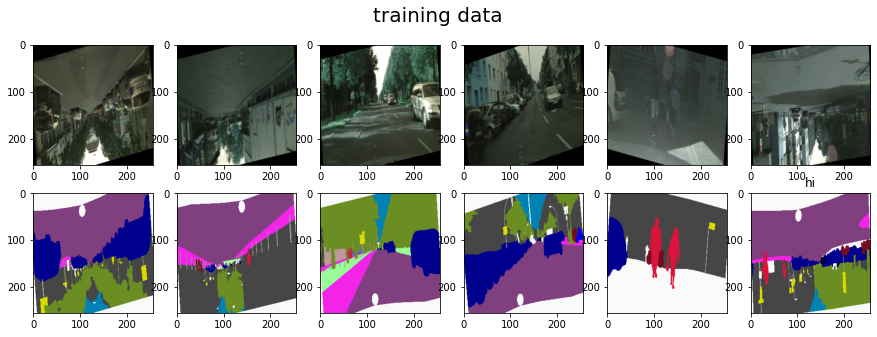

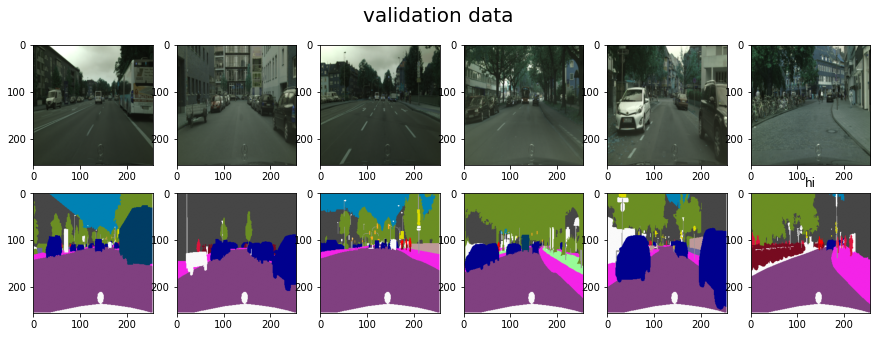

In [11]:
# Display training and validation data
num_vis_img = bs
visualize_data(num_vis_img, trainloader, traindataset, 'training data')
visualize_data(num_vis_img, validloader, validdataset, 'validation data')

### 2.4 Loss function and optimiser

In [11]:
# loss function
loss_f = nn.CrossEntropyLoss(size_average = True, ignore_index=250)

params = weight_decay(model, l2_value=0.0001)
opt = torch.optim.Adam(params, lr=0.0001)

### 2.5 Training the model

In [13]:
device = "cuda" #if torch.cuda.is_available() else "cpu"
model.to(device)

R2UNet(
  (Maxpool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (Upsample): Upsample(scale_factor=2.0, mode=nearest)
  (RR_block1): rr_block(
    (rcnn): Sequential(
      (0): rec_block(
        (rec_conv): Sequential(
          (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU(inplace=True)
          (3): Dropout(p=0.5, inplace=False)
        )
      )
      (1): rec_block(
        (rec_conv): Sequential(
          (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU(inplace=True)
          (3): Dropout(p=0.5, inplace=False)
        )
      )
    )
    (conv): Conv2d(3, 64, kernel_size=(1, 1), stride=(1, 1))
  )
  (RR_block2): rr_block(
    (rcnn): Sequential(
      (0): rec_block(
    

In [18]:
criterion = loss_f
history = train(traindataset, validdataset, trainloader, validloader, model, criterion, opt, epochs)

Epoch 1: 100%|██████████| 496/496 [22:50<00:00,  2.76s/batch, loss=0.963]
Validation Epoch 1: : 84it [02:14,  1.60s/it, loss=1.92]                       


=> Saving checkpoint


Epoch 2: 100%|██████████| 496/496 [22:06<00:00,  2.68s/batch, loss=0.994]
Validation Epoch 2: : 84it [02:21,  1.69s/it, loss=2.75]                       


=> Saving checkpoint


Epoch 3: 100%|██████████| 496/496 [22:22<00:00,  2.71s/batch, loss=0.644]
Validation Epoch 3: : 84it [02:07,  1.52s/it, loss=2.22]                       


=> Saving checkpoint


Epoch 4: 100%|██████████| 496/496 [22:37<00:00,  2.74s/batch, loss=0.728]
Validation Epoch 4: : 84it [02:13,  1.59s/it, loss=4.62]                       


=> Saving checkpoint


Epoch 5: 100%|██████████| 496/496 [22:57<00:00,  2.78s/batch, loss=0.604]
Validation Epoch 5: : 84it [02:17,  1.64s/it, loss=1.92]                       


=> Saving checkpoint


Epoch 6: 100%|██████████| 496/496 [22:47<00:00,  2.76s/batch, loss=0.405]
Validation Epoch 6: : 84it [02:13,  1.59s/it, loss=2.79]                       


=> Saving checkpoint


Epoch 7: 100%|██████████| 496/496 [22:40<00:00,  2.74s/batch, loss=0.528]
Validation Epoch 7: : 84it [02:17,  1.64s/it, loss=2.06]                       


=> Saving checkpoint


Epoch 8: 100%|██████████| 496/496 [22:51<00:00,  2.76s/batch, loss=0.611]
Validation Epoch 8: : 84it [02:08,  1.52s/it, loss=3.31]                       


=> Saving checkpoint


Epoch 9: 100%|██████████| 496/496 [22:24<00:00,  2.71s/batch, loss=0.763]
Validation Epoch 9: : 84it [02:14,  1.60s/it, loss=1.43]                       


=> Saving checkpoint


Epoch 10: 100%|██████████| 496/496 [22:30<00:00,  2.72s/batch, loss=0.497]
Validation Epoch 10: : 84it [02:14,  1.60s/it, loss=1.86]                       


=> Saving checkpoint


Epoch 11: 100%|██████████| 496/496 [22:31<00:00,  2.73s/batch, loss=0.632]
Validation Epoch 11: : 84it [02:13,  1.58s/it, loss=1.88]                       


=> Saving checkpoint


Epoch 12: 100%|██████████| 496/496 [22:34<00:00,  2.73s/batch, loss=0.558]
Validation Epoch 12: : 84it [02:14,  1.60s/it, loss=1.59]                       


=> Saving checkpoint


Epoch 13: 100%|██████████| 496/496 [22:37<00:00,  2.74s/batch, loss=0.513]
Validation Epoch 13: : 84it [02:10,  1.56s/it, loss=1.87]                       


=> Saving checkpoint


Epoch 14: 100%|██████████| 496/496 [22:22<00:00,  2.71s/batch, loss=0.354]
Validation Epoch 14: : 84it [02:14,  1.60s/it, loss=1.41]                       


=> Saving checkpoint


Epoch 15: 100%|██████████| 496/496 [23:25<00:00,  2.83s/batch, loss=0.509]
Validation Epoch 15: : 84it [02:22,  1.69s/it, loss=1.36]                       


=> Saving checkpoint


Epoch 16: 100%|██████████| 496/496 [24:11<00:00,  2.93s/batch, loss=0.492]
Validation Epoch 16: : 84it [02:21,  1.68s/it, loss=1.24]                       


=> Saving checkpoint


Epoch 17: 100%|██████████| 496/496 [23:34<00:00,  2.85s/batch, loss=0.469]
Validation Epoch 17: : 84it [02:22,  1.69s/it, loss=1.25]                       


=> Saving checkpoint


Epoch 18: 100%|██████████| 496/496 [23:53<00:00,  2.89s/batch, loss=0.599]
Validation Epoch 18: : 84it [02:24,  1.72s/it, loss=2.78]                       


=> Saving checkpoint


Epoch 19: 100%|██████████| 496/496 [24:37<00:00,  2.98s/batch, loss=0.422]
Validation Epoch 19: : 84it [02:25,  1.73s/it, loss=1.35]                       


=> Saving checkpoint


Epoch 20: 100%|██████████| 496/496 [24:33<00:00,  2.97s/batch, loss=0.514]
Validation Epoch 20: : 84it [02:24,  1.72s/it, loss=1.47]                       


=> Saving checkpoint


**Observe the training and validation curves**

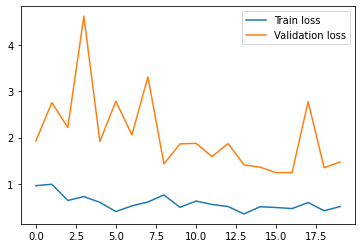

In [20]:
fig = plt.figure()
plt.plot(history[0])
plt.plot(history[1])
plt.legend(['Train loss', 'Validation loss'])
plt.show()
#fig.savefig('/s8awdesh/trained_models/Task2/Plots/train_loss_curve.png')

### 2.6 Model Evaluation

**Get average scores over the entire set**

In [18]:
checkpoint_path = "/s8awdesh/trained_models/Task2/r2unet_ep"
model = R2UNet()
model.to(device)
evaluation(checkpoint_path, validdataset, validloader, bs, model, DEVICE, num_classes=20)

=> Loading checkpoint


100%|██████████| 84/84 [03:00<00:00,  2.15s/it]

avg_jacc or iou: 0.14620846168822552,avg_dice: 0.1927804404712585, f1_score: 0.19802343387959573,accuracy: 0.19751311838626862


**Plot per epoch scores**

In [18]:
f1_scores = []
iou_scores = []
dice_scores = []
accuracy = []

loader = validloader
dataset = validdataset
bs = bs

for epoch in range(0, epochs):
    model_dir = "/s8awdesh/trained_models/Task2/r2unet_ep" + str(epoch) + ".pth.tar"
    iou, dice, f1, acc = eval_metric_per_epoch(model_dir, model, dataset, loader, bs)
    iou_scores.append(iou)
    dice_scores.append(dice)
    f1_scores.append(f1)
    accuracy.append(acc) 

=> Loading checkpoint


100%|██████████| 84/84 [03:21<00:00,  2.40s/it]


=> Loading checkpoint


100%|██████████| 84/84 [03:17<00:00,  2.35s/it]


=> Loading checkpoint


100%|██████████| 84/84 [03:11<00:00,  2.28s/it]


=> Loading checkpoint


100%|██████████| 84/84 [03:04<00:00,  2.19s/it]


=> Loading checkpoint


100%|██████████| 84/84 [03:13<00:00,  2.30s/it]


=> Loading checkpoint


100%|██████████| 84/84 [03:00<00:00,  2.15s/it]


=> Loading checkpoint


100%|██████████| 84/84 [03:13<00:00,  2.30s/it]


=> Loading checkpoint


100%|██████████| 84/84 [03:39<00:00,  2.61s/it]


=> Loading checkpoint


100%|██████████| 84/84 [03:40<00:00,  2.63s/it]


=> Loading checkpoint


100%|██████████| 84/84 [03:06<00:00,  2.22s/it]


=> Loading checkpoint


100%|██████████| 84/84 [03:35<00:00,  2.56s/it]


=> Loading checkpoint


100%|██████████| 84/84 [03:19<00:00,  2.38s/it]


=> Loading checkpoint


100%|██████████| 84/84 [03:11<00:00,  2.28s/it]


=> Loading checkpoint


100%|██████████| 84/84 [02:41<00:00,  1.92s/it]


=> Loading checkpoint


100%|██████████| 84/84 [02:47<00:00,  1.99s/it]


=> Loading checkpoint


100%|██████████| 84/84 [03:14<00:00,  2.31s/it]


=> Loading checkpoint


100%|██████████| 84/84 [03:17<00:00,  2.35s/it]


=> Loading checkpoint


100%|██████████| 84/84 [03:10<00:00,  2.27s/it]


=> Loading checkpoint


100%|██████████| 84/84 [02:54<00:00,  2.08s/it]


=> Loading checkpoint


100%|██████████| 84/84 [02:54<00:00,  2.08s/it]


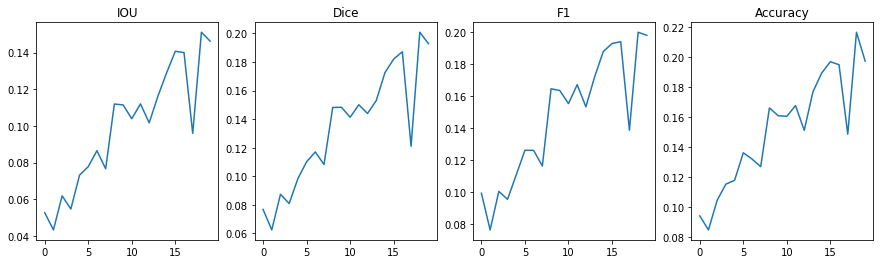

<Figure size 432x288 with 0 Axes>

In [19]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(15,4))
ax1.plot(iou_scores)
ax1.set_title("IOU")
ax2.plot(dice_scores)
ax2.set_title("Dice")
ax3.plot(f1_scores)
ax3.set_title("F1")
ax4.plot(accuracy)
ax4.set_title("Accuracy")
plt.show()
plt.savefig('/s8awdesh/trained_models/Task2/Plots/r2unet_metrics.png')

In [26]:
# Find AUC of the final model

load_checkpoint("/s8awdesh/trained_models/Task2/r2unet_ep" + str(19) + ".pth.tar", model)
model.eval()
auc_score = 0

with torch.no_grad():
    for batch_idx, (images, labels) in enumerate(tqdm(trainloader)):
        images, labels = images.to(device), labels.to(device)
        output = torch.sigmoid(model(images))
        output_2d = torch.argmax(output, dim=1).detach().cpu()
        labels = labels.cpu()
        
        auc_score += find_auc(labels, output_2d, num_classes=20, batch_sz=bs)

print(f"AUC = {auc_score/len(traindataset)}")

=> Loading checkpoint


100%|██████████| 496/496 [26:39<00:00,  3.22s/it]

AUC = 0.10476458455413691


### 2.7 Visualize results

=> Loading checkpoint


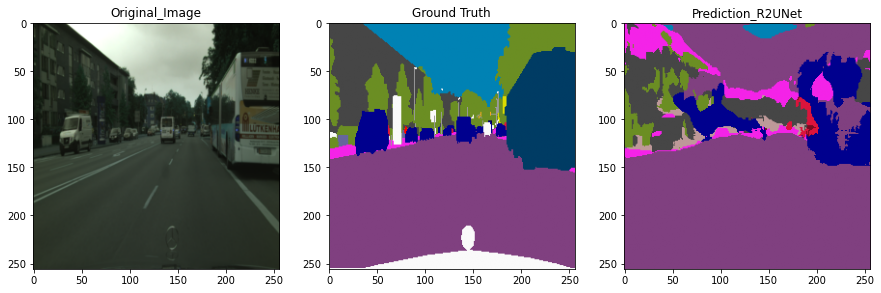

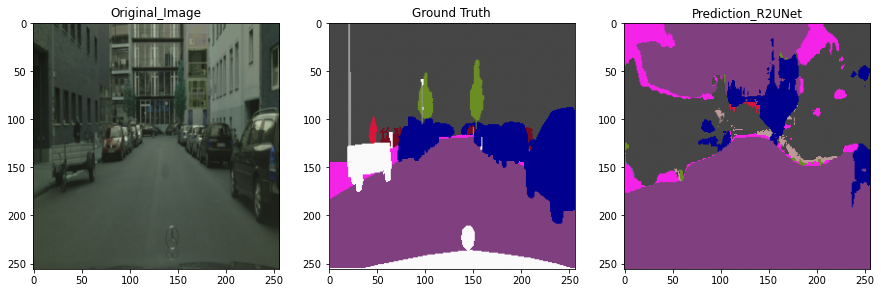

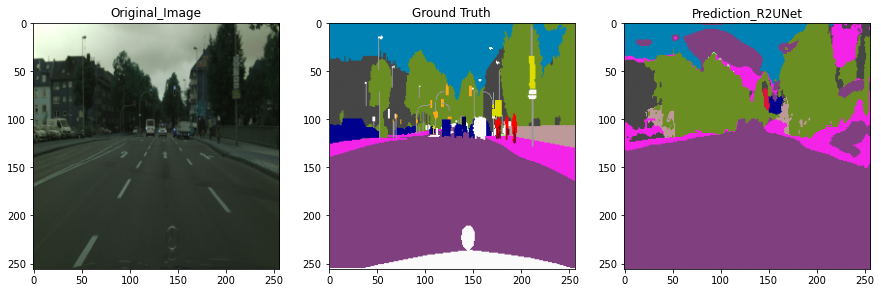

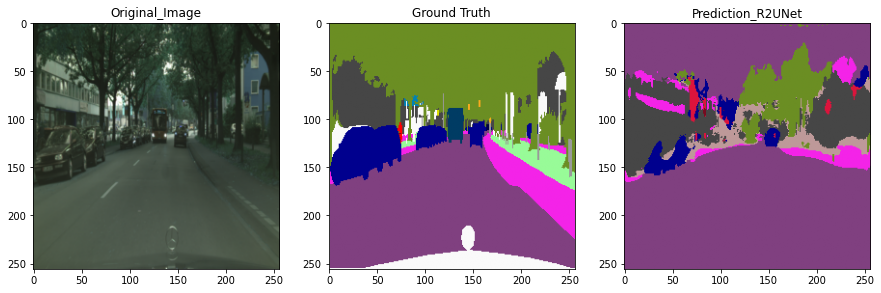

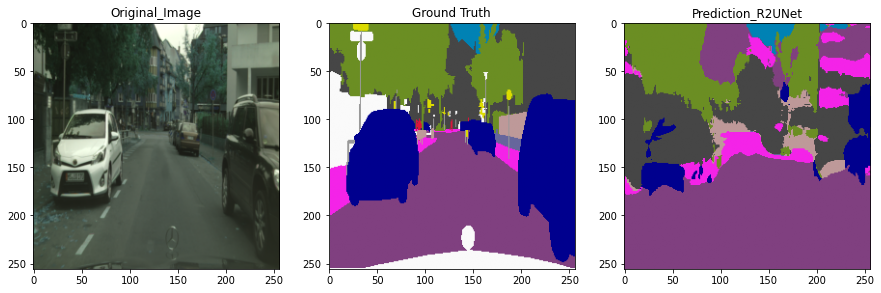

...

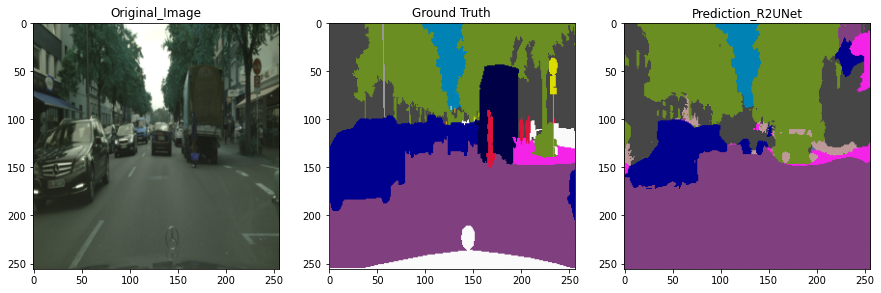

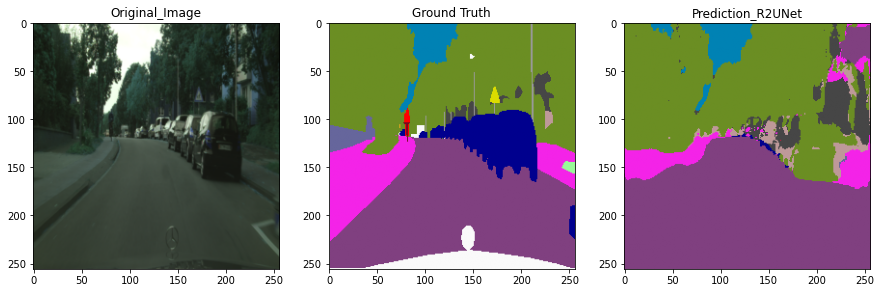

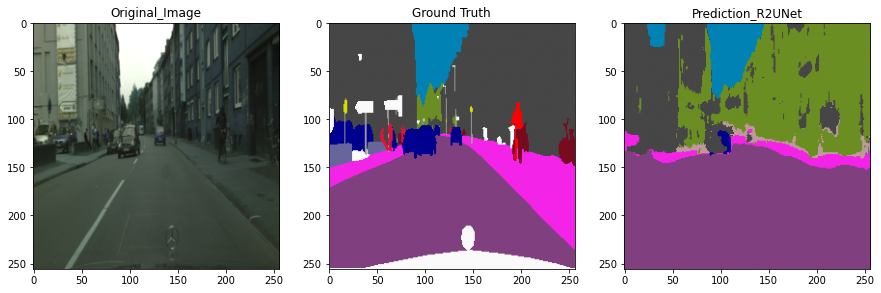

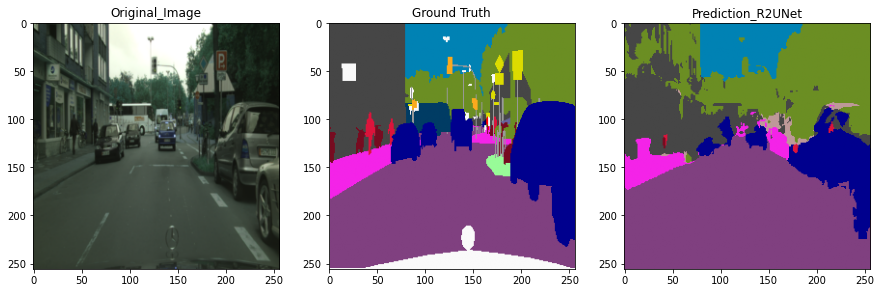

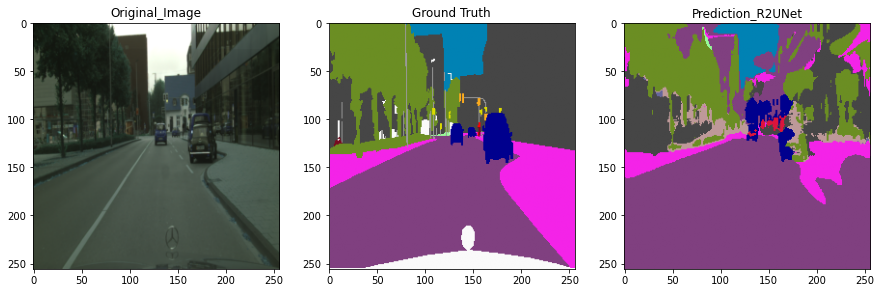

In [21]:
from skimage.io import imsave
load_checkpoint("/s8awdesh/trained_models/Task2/r2unet_ep" + str(19) + ".pth.tar", model)

model.eval()

with torch.no_grad():

    for batch_idx, (images,labels) in enumerate(validloader):
        # Number of batches to analyze
        if batch_idx>10:
            break

        images, labels = images.to(device), labels.to(device)

        output = torch.sigmoid(model(images))
        output_2d = torch.argmax(output, dim=1).detach().cpu().numpy()

        imgs = images.cpu().numpy().transpose([0,2,3,1])

        save_path = '/s8awdesh/trained_models/Task2/Plots/'

        # Analyzing every image in the batch
        for img_num in range(0,bs): 
            plt.figure(figsize=(15,20))

            plt.subplot(1,3,1).set_title('Original_Image')
            plt.imshow(np.clip(imgs[img_num,:,:,:], 0, 1))
            #imsave(save_path + 'org_img_' + str(img_num) + '_batch_' + str(batch_idx) + '.png', np.uint8(np.clip(imgs[img_num,:,:,:], 0, 1)*255))

            plt.subplot(1,3,2).set_title('Ground Truth')
            GT_mask_rgb = traindataset.decode_segmap(labels.cpu().numpy()[img_num])
            plt.imshow(GT_mask_rgb) # Single channel GT mask to RGB Image
            #imsave(save_path + 'gt_mask_' + str(img_num) + '_batch_' + str(batch_idx)  + '.png', GT_mask_rgb)

            plt.subplot(1,3,3).set_title('Prediction_R2UNet')
            pred_mask_rgb = traindataset.decode_segmap(output_2d[img_num])
            plt.imshow(pred_mask_rgb) # Single channel prediction mask to RGB Image
            #imsave(save_path + 'pred_mask_' + str(img_num) + '_batch_' + str(batch_idx) + '.png', pred_mask_rgb)

            #plt.savefig(save_path + 'all_res_batch_' + str(batch_idx) + '_img_' + str(img_num) + '.png')